In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn

In [30]:
df = pd.read_csv('data/preprocessed_data.csv',low_memory=False)
df

,SalePrice,datasource,YearMade,MachineHoursCurrentMeter,UsageBand,fiModelDesc,fiBaseModel,fiSecondaryDesc,fiModelSeries,fiModelDescriptor,...,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls,saleYear,saleMonth,saleDay,saleYearofDay,saleWeekofDay
0,9500.0,132,1974,97.0,0,4593,1744,0,0,0,...,1,8,6,0,0,1989,1,17,17,1
1,14000.0,132,1980,97.0,0,1820,559,0,0,0,...,0,0,0,4,2,1989,1,31,31,1
2,50000.0,132,1978,97.0,0,2348,713,59,0,0,...,1,8,6,0,0,1989,1,31,31,1
3,16000.0,132,1980,97.0,0,1819,558,0,0,0,...,0,0,0,4,2,1989,1,31,31,1
4,22000.0,132,1984,97.0,0,2119,683,21,0,0,...,1,6,5,0,0,1989,1,31,31,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399429,16000.0,149,2001,97.0,0,2101,690,50,0,0,...,1,6,6,0,0,2012,4,28,119,5
399430,6000.0,149,2004,97.0,0,240,84,0,0,0,...,0,0,0,0,0,2012,4,28,119,5
399431,16000.0,149,2004,97.0,0,627,203,59,0,0,...,0,0,0,0,0,2012,4,28,119,5
399432,55000.0,149,1993,97.0,0,83,19,59,0,0,...,0,0,0,0,0,2012,4,28,119,5


In [3]:
from autoviz import AutoViz_Class
AV = AutoViz_Class()

Imported v0.1.604. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [32]:
%matplotlib inline
filename = 'data/preprocessed_data.csv'
target_variable = 'SalePrice'

dft = AV.AutoViz(filename,sep=',',depVar=target_variable,
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    save_plot_dir=None,
    )

    max_rows_analyzed is smaller than dataset shape 399434...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 53)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
datasource,0.000000,0.050000,int64,5,0,0,
YearMade,0.000000,0.570000,int64,57,0,0,
Ripper,0.000000,0.050000,int64,5,0,0,
Scarifier,0.000000,0.030000,int64,3,0,0,
Tip_Control,0.000000,0.040000,int64,4,0,0,
Tire_Size,0.000000,0.160000,int64,16,0,0,
Coupler,0.000000,0.040000,int64,4,0,0,
Coupler_System,0.000000,0.030000,int64,3,0,0,
Grouser_Tracks,0.000000,0.030000,int64,3,0,0,
Hydraulics_Flow,0.000000,0.030000,int64,3,0,0,


    52 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################
Number of variables = 52 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 51 Categorical vars selected 
    Adding 51 categorical variables to reduced numeric variables  of 1
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 52 
    Finding Important Features using Boosted Trees algorithm...
        using 52 variables...
        using 42 variables...
        using 32 variables...
        using 22 variables...
Finding top features using XGB is crashing. Continuing with all predictors...
    Since number of features selected is greater than max columns analyzed, limiting to 30 variables
#############################

In [33]:
# Calculate z-scores for each column in the DataFrame
z_scores = np.abs((df - df.mean()) / df.std())

# Define a threshold (e.g., z-score > 3) to identify outliers
threshold = 3

# Find rows where any column has a z-score greater than the threshold
outliers = df[(z_scores > threshold).any(axis=1)]


In [34]:
# Drop the rows containing outliers
df_without_outliers = df.drop(outliers.index)


In [35]:
df_without_outliers

,SalePrice,datasource,YearMade,MachineHoursCurrentMeter,UsageBand,fiModelDesc,fiBaseModel,fiSecondaryDesc,fiModelSeries,fiModelDescriptor,...,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls,saleYear,saleMonth,saleDay,saleYearofDay,saleWeekofDay
0,9500.0,132,1974,97.0,0,4593,1744,0,0,0,...,1,8,6,0,0,1989,1,17,17,1
1,14000.0,132,1980,97.0,0,1820,559,0,0,0,...,0,0,0,4,2,1989,1,31,31,1
2,50000.0,132,1978,97.0,0,2348,713,59,0,0,...,1,8,6,0,0,1989,1,31,31,1
3,16000.0,132,1980,97.0,0,1819,558,0,0,0,...,0,0,0,4,2,1989,1,31,31,1
4,22000.0,132,1984,97.0,0,2119,683,21,0,0,...,1,6,5,0,0,1989,1,31,31,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399426,13000.0,149,2005,97.0,0,4261,1538,0,0,0,...,0,0,0,0,0,2012,4,28,119,5
399427,53000.0,149,2004,97.0,0,4818,1860,0,0,0,...,0,0,0,4,2,2012,4,28,119,5
399429,16000.0,149,2001,97.0,0,2101,690,50,0,0,...,1,6,6,0,0,2012,4,28,119,5
399430,6000.0,149,2004,97.0,0,240,84,0,0,0,...,0,0,0,0,0,2012,4,28,119,5


In [36]:
df_without_outliers.to_csv('data/df_without_outliers.csv',index=False)

In [37]:
%matplotlib inline
filename = 'data/df_without_outliers.csv'
target_variable = 'SalePrice'

dft = AV.AutoViz(filename,sep=',',depVar=target_variable,
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    save_plot_dir=None,
    )

    max_rows_analyzed is smaller than dataset shape 255706...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 53)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Not able to read or load file. Please check your inputs and try again...


In [38]:
can_remove = ['Blade_Extension', 'Blade_Width', 'Enclosure_Type', 'Engine_Horsepower', 'Pushblock', 'Tip_Control']
df_without_outliers.drop(can_remove,axis=1,inplace=True)

    max_rows_analyzed is smaller than dataset shape 255706...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 47)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nullpercent,NuniquePercent,dtype,Nuniques,Nulls,Least num. of categories,Data cleaning improvement suggestions
datasource,0.000000,0.040000,int64,4,0,0,
Pattern_Changer,0.000000,0.030000,int64,3,0,0,
Tire_Size,0.000000,0.090000,int64,9,0,0,
Coupler,0.000000,0.040000,int64,4,0,0,
Coupler_System,0.000000,0.020000,int64,2,0,0,
Grouser_Tracks,0.000000,0.020000,int64,2,0,0,
Hydraulics_Flow,0.000000,0.030000,int64,3,0,0,
Track_Type,0.000000,0.030000,int64,3,0,0,
Undercarriage_Pad_Width,0.000000,0.160000,int64,16,0,0,
Stick_Length,0.000000,0.220000,int64,22,0,0,


    46 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...

################ Regression problem #####################
Number of variables = 46 exceeds limit, finding top 30 variables through XGBoost
    No categorical feature reduction done. All 45 Categorical vars selected 
    Adding 45 categorical variables to reduced numeric variables  of 1
############## F E A T U R E   S E L E C T I O N  ####################
Current number of predictors = 46 
    Finding Important Features using Boosted Trees algorithm...
        using 46 variables...
        using 37 variables...
        using 28 variables...
        using 19 variables...
        using 10 variables...
        using 1 variables...
Found 26 important features
#######################################################################################
######################## C L A S 

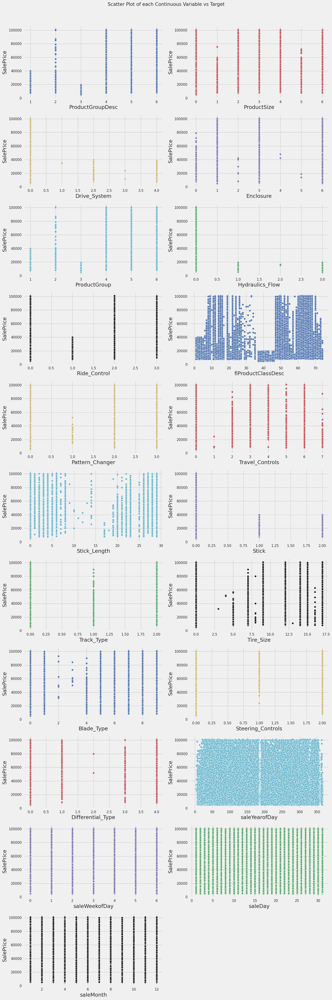

Number of All Scatter Plots = 231


Could not draw some Distribution Plots


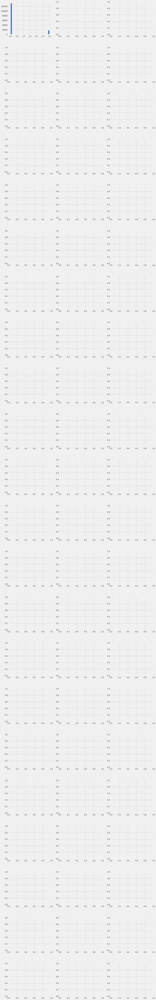

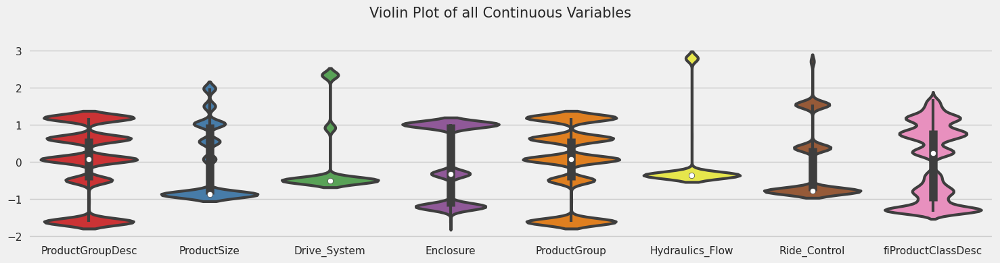

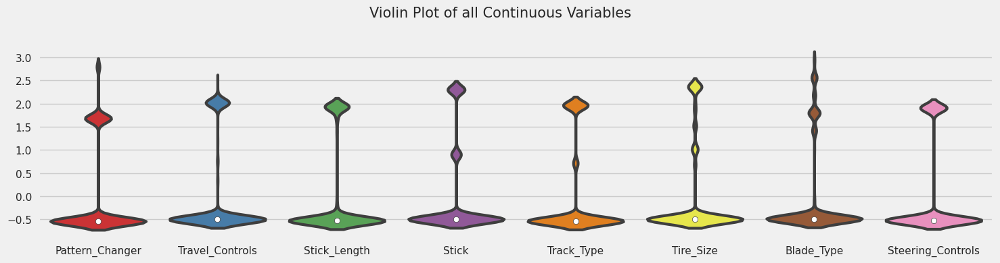

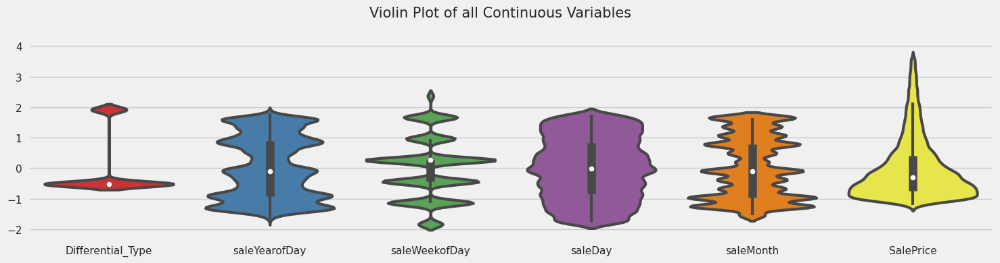

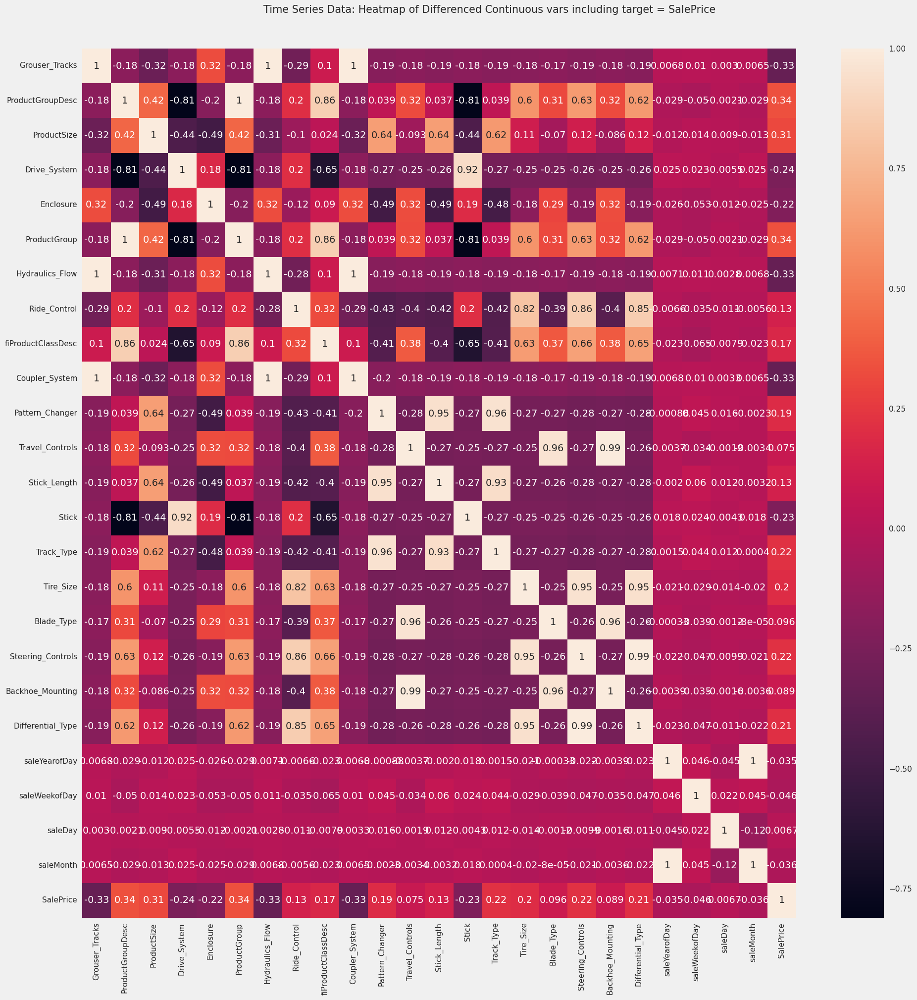

Could not draw some Time Series plots


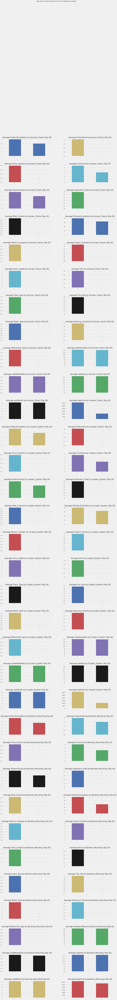

All Plots done
Time to run AutoViz = 237 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [4]:
%matplotlib inline
filename = 'data/df_without_outliers.csv'
target_variable = 'SalePrice'

dft = AV.AutoViz(filename,sep=',',depVar=target_variable,
    dfte=None,
    header=0,
    verbose=1,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    save_plot_dir=None,
    )